In [1]:
import os

# Define the directory path
directory = "/Users/dipa/Desktop/data25/txt_data/"

# A list comprehension to create a list of file names that end with the ".txt" extension in the specified directory.
txt_files = [file for file in os.listdir(directory) if file.endswith(".txt")]

# Sort the file names in the desired order
sorted_txt_files = sorted(txt_files, key=lambda x: x.lower())

# This line initializes an empty dictionary to store the contents of the text files, with the file names as keys.
txt_data = {}

# Loop over each file name in the sorted_txt_files list.
for file in sorted_txt_files:
    # To concatenate the directory path and the current file name, creating the complete path to the file.
    file_path = os.path.join(directory, file)
    
    # Open the file specified by file_path in read mode ("r") using the open() function.
    with open(file_path, "r") as txt_file: 
        # Read the entire contents of the opened file and assign the content to the variable txt_text.
        txt_text = txt_file.read()
        
        # Add the content of the current file (txt_text) to the txt_data dictionary, with the file name as the key.
        txt_data[file] = txt_text

# Print the contents of each file
for file, text in txt_data.items():
    print(f"Text from {file}:")
    print(text)
    print("\n")

Text from apple_2023_cleaned_data.txt:
Apple Privacy Policy
Apple’s Privacy Policy describes how Apple collects, uses, and shares your personal data.
In addition to this Privacy Policy, we provide data and privacy information embedded in our products and certain features that ask to use your personal data. This product-specific information is accompanied by our Data & Privacy Icon.
You will be given an opportunity to review this product-specific information before using these features. You also can view this information at any time, either in settings related to those features and/or online atapple.com/legal/privacy/data.
You can familiarize yourself with our privacy practices, accessible via the headings below, andcontact usif you have any questions.
Download a copy of this Privacy PolicyYour California Privacy DisclosuresInformation Regarding Commercial Electronic Messages in CanadaApple Health Study Apps Privacy Policy
At Apple, we believe strongly in fundamental privacy rights — an

# Data Preprocessing

In [2]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer
import re

# Download necessary resources
nltk.download('punkt')
nltk.download('stopwords')

# Tokenization
tokenized_data = [word_tokenize(text.lower()) for text in txt_data.values()]

# Remove forward slashes and periods using regular expressions
#tokenized_data = [[re.sub(r'[.,/\\\']', '', token) for token in tokens] for tokens in tokenized_data]

import re

# Define a function to remove specified punctuations
def remove_punctuations(tokens):
    # Define the pattern for punctuations you want to remove
    pattern = r'[.,/\\\'\-\s]'  # This pattern will remove . , / \ ' - and spaces

    # Use re.sub() to remove punctuations from each token
    return [re.sub(pattern, '', token) for token in tokens]

# Apply the function to the tokenized_data
tokenized_data = [remove_punctuations(tokens) for tokens in tokenized_data]

##### Remove spaces and punctuations using regular expressions
#tokenized_data = [[re.sub(r'[.,/\\\']', '', token) for token in tokens if not token.isspace()] for tokens in tokenized_data]


# Removal of punctuation
punctuation = set(string.punctuation)
tokenized_data = [[token for token in tokens if token not in punctuation] for tokens in tokenized_data]

# Removal of stopwords
stop_words = set(stopwords.words('english'))
tokenized_data = [[token for token in tokens if token.lower() not in stop_words] for tokens in tokenized_data]

#### Removal of words with two or fewer characters
#tokenized_data = [[token for token in tokens if len(token) > 2] for tokens in tokenized_data]

# Removal of words with one or fewer characters
tokenized_data = [[token for token in tokens if len(token) > 1] for tokens in tokenized_data]

# Removal of numerical terms
tokenized_data = [[token for token in tokens if not token.isdigit()] for tokens in tokenized_data]

# Lemmatization

lemmatizer = WordNetLemmatizer()
tokenized_data = [[lemmatizer.lemmatize(token) for token in tokens] for tokens in tokenized_data]

# Print the number of documents and check if ":" exists in the tokenized data   
print(len(tokenized_data))
print(":" in tokenized_data)
print("." in tokenized_data)
print("," in tokenized_data)

[nltk_data] Downloading package punkt to /Users/dipa/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/dipa/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


25
False
False
False


In [3]:
print (tokenized_data)

[['apple', 'privacy', 'policy', 'apple', 'privacy', 'policy', 'describes', 'apple', 'collect', 'us', 'share', 'personal', 'data', 'addition', 'privacy', 'policy', 'provide', 'data', 'privacy', 'information', 'embedded', 'product', 'certain', 'feature', 'ask', 'use', 'personal', 'data', 'productspecific', 'information', 'accompanied', 'data', 'privacy', 'icon', 'given', 'opportunity', 'review', 'productspecific', 'information', 'using', 'feature', 'also', 'view', 'information', 'time', 'either', 'setting', 'related', 'feature', 'andor', 'online', 'atapplecomlegalprivacydata', 'familiarize', 'privacy', 'practice', 'accessible', 'via', 'heading', 'andcontact', 'usif', 'question', 'download', 'copy', 'privacy', 'policyyour', 'california', 'privacy', 'disclosuresinformation', 'regarding', 'commercial', 'electronic', 'message', 'canadaapple', 'health', 'study', 'apps', 'privacy', 'policy', 'apple', 'believe', 'strongly', 'fundamental', 'privacy', 'right', 'fundamental', 'right', 'differ', 'd

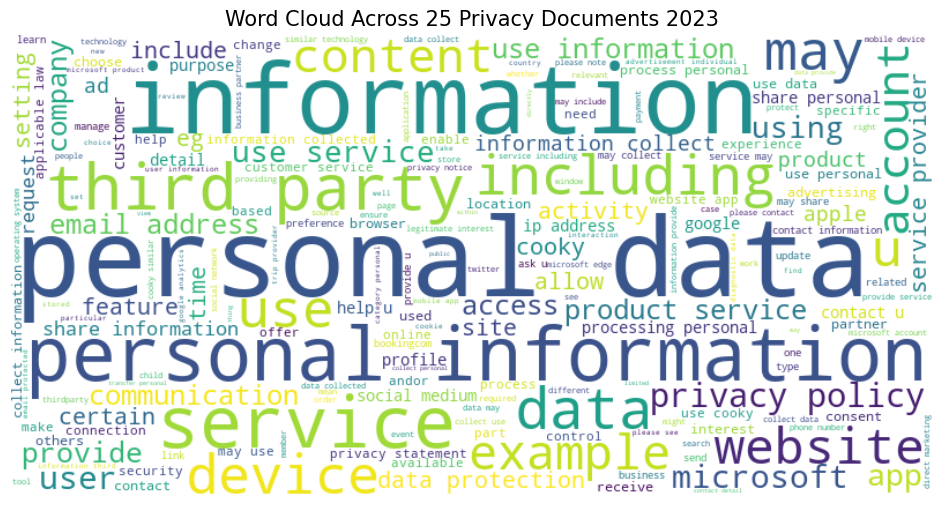

In [209]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

##### Flatten the tokenized_data list
all_tokens = [token for tokens in tokenized_data for token in tokens]

#### Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_tokens))

#### Plot the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud Across 25 Privacy Documents 2023', fontsize=15)
plt.show()


## Create a dictionary from the tokenized_data
the lemmatized tokens refers to the column in the dataset that contains the lemmatized tokens. The corpora.Dictionary() function is used to create a dictionary from the lemmatized tokens. This dictionary maps each unique token to a unique numeric ID.

In [4]:
from gensim.corpora.dictionary import Dictionary

# Create a dictionary from tokenized_data
dictionary = Dictionary(tokenized_data)

# Print the dictionary
print(dictionary)

Dictionary<7377 unique tokens: ['18002752273for', 'abides', 'ability', 'able', 'access']...>


## Bag of words
The dictionary.doc2bow(tokens) is a method from the dictionary object that converts a list of tokens into a bag-of-words representation. doc2bow stands for "document to bag of words". It takes a list of tokens and returns a list of tuples, where each tuple represents a token's ID and its frequency (count) in the document.

The resulting list is assigned to the variable doc_term_matrix, which represents the document-term matrix. It is a matrix-like structure where each row corresponds to a document, and each column represents a token's ID, with the cell value indicating the frequency of that token in the document.

In [5]:

##### Create a bag-of-words representation for each document
bow_corpus = [dictionary.doc2bow(doc) for doc in tokenized_data]

#### Print the bag-of-words representation for the first document
print(bow_corpus[0])

[(0, 1), (1, 2), (2, 2), (3, 2), (4, 10), (5, 4), (6, 1), (7, 1), (8, 2), (9, 4), (10, 26), (11, 2), (12, 2), (13, 2), (14, 4), (15, 6), (16, 4), (17, 2), (18, 2), (19, 4), (20, 17), (21, 5), (22, 4), (23, 12), (24, 2), (25, 6), (26, 10), (27, 2), (28, 5), (29, 1), (30, 2), (31, 2), (32, 6), (33, 1), (34, 1), (35, 2), (36, 4), (37, 35), (38, 2), (39, 1), (40, 3), (41, 2), (42, 2), (43, 2), (44, 2), (45, 6), (46, 12), (47, 4), (48, 212), (49, 6), (50, 2), (51, 2), (52, 1), (53, 1), (54, 8), (55, 2), (56, 4), (57, 4), (58, 15), (59, 4), (60, 6), (61, 2), (62, 2), (63, 9), (64, 2), (65, 2), (66, 2), (67, 2), (68, 2), (69, 4), (70, 2), (71, 4), (72, 1), (73, 1), (74, 3), (75, 1), (76, 1), (77, 2), (78, 2), (79, 2), (80, 2), (81, 2), (82, 2), (83, 2), (84, 14), (85, 2), (86, 2), (87, 2), (88, 2), (89, 2), (90, 4), (91, 2), (92, 10), (93, 2), (94, 8), (95, 2), (96, 2), (97, 1), (98, 2), (99, 2), (100, 2), (101, 6), (102, 4), (103, 2), (104, 2), (105, 10), (106, 1), (107, 2), (108, 2), (109, 

### The top 10 terms along with the corresponding document number. It provides an overview of the most frequent terms in each document.

## Topic modelling 

In [28]:
#from gensim.models import LdaModel

##### Set the number of topics
#num_topics = 20

#### Train the LDA model
#lda_model = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary)

#### Print the topics
#for topic_id in range(num_topics):
#    print(f"Topic {topic_id + 1}: {lda_model.print_topic(topic_id)}")


# Visualisation 

In [29]:
#import pyLDAvis.gensim

#### Visualize the topics
#vis_data = pyLDAvis.gensim.prepare(lda_model, bow_corpus, dictionary)
#pyLDAvis.display(vis_data)


### Slide to adjust relevance metric: 
This slider allows you to adjust the relevance metric used in the visualization. Moving the slider changes the trade-off between term frequency (λ) and term-specific relevance (1 - λ).

### PC1 and PC2: 
These represent the principal components of the topic-term matrix. They help visualize the relationships between topics and terms.

### Marginal topic distribution:
This bar chart shows the distribution of topics across the entire corpus. Each bar represents a topic, and the height of the bar indicates the prevalence of that topic in the corpus.

### Intertopic Distance Map (via multidimensional scaling): 
This plot visualizes the similarity between topics. Topics that are closer to each other are more similar in terms of their term distribution.

### Overall term frequency: 
This bar chart displays the overall term frequency in the corpus. It gives an idea of how frequently each term appears across all topics.

### Estimated term frequency within the selected topic: 
This bar chart shows the estimated term frequency within the selected topic. It gives an idea of how important each term is within the chosen topic.

### Top-30 Most Relevant Terms: 
This table displays the top 30 most relevant terms in the selected topic. These terms are ranked based on their relevance score, which combines term frequency and term-specific relevance.

# Tfidt

In [30]:
#from gensim.corpora.dictionary import Dictionary
#from gensim.models.tfidfmodel import TfidfModel

#### Create a Dictionary from the tokenized_data
#dictionary = Dictionary(tokenized_data)

#### Create a corpus from the tokenized_data using the dictionary
#corpus = [dictionary.doc2bow(doc) for doc in tokenized_data]

##### Create a TF-IDF model from the corpus
#tfidf = TfidfModel(corpus)

##### Get the TF-IDF representation of the 5th document
#dataset_index = 4  # Index of the dataset in the tokenized_data list
#dataset_name = list(txt_data.keys())[dataset_index]
#tfidf_doc = tfidf[corpus[dataset_index]]

##### Sort the TF-IDF representation in descending order
#tfidf_doc = sorted(tfidf_doc, key=lambda w: w[1], reverse=True)

#### Print the top 5 words of the document alongside the TF-IDF score
#print(f"Top 5 Words of {dataset_name}")
#for word_id, tfidf_score in tfidf_doc[:5]:
#    print(dictionary.get(word_id), tfidf_score)


In [31]:
#from gensim.corpora.dictionary import Dictionary
#from gensim.models.tfidfmodel import TfidfModel

#### Create a Dictionary from the tokenized_data
#dictionary = Dictionary(tokenized_data)

#### Create a corpus from the tokenized_data using the dictionary
#corpus = [dictionary.doc2bow(doc) for doc in tokenized_data]

#### Create a TF-IDF model from the corpus
#tfidf = TfidfModel(corpus)

#### Perform TF-IDF on each document
#for dataset_name, doc in zip(txt_data.keys(), corpus):
#    tfidf_doc = tfidf[doc]
#    tfidf_doc = sorted(tfidf_doc, key=lambda w: w[1], reverse=True)
    
####    # Print the top 5 words of each document alongside the TF-IDF score
#    print(f"Top 5 Words of {dataset_name}")
#    for word_id, tfidf_score in tfidf_doc[:5]:
#        print(dictionary.get(word_id), tfidf_score)
#    print("\n")


# With N-gram (bi-gram)

In NLP, a bi-gram refers to a sequence of two adjacent words in a text. The nltk.ngrams function from the NLTK library is used to generate these bi-grams.

In [8]:
# Bi-gram generation
text_data_bigrams = [list(nltk.ngrams(doc, 2)) for doc in tokenized_data]

# Print the number of documents and check if ":" exists in the tokenized data
print(len(text_data_bigrams))

25


In [137]:
#print (text_data_bigrams[1]) 

In [9]:
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
text_data_bigrams_lemmatized = [[lemmatizer.lemmatize(' '.join(token)) for token in doc] for doc in text_data_bigrams]
print (text_data_bigrams_lemmatized[24])

['twitter privacy', 'privacy policy', 'policy effective', 'effective may', 'may scroll', 'scroll read', 'read itâ\x80\x99s', 'itâ\x80\x99s really', 'really hard', 'hard make', 'make everyone', 'everyone happy', 'happy privacy', 'privacy policy', 'policy people', 'people use', 'use twitter', 'twitter want', 'want something', 'something short', 'short easy', 'easy understand', 'understand wish', 'wish could', 'could fit', 'fit everything', 'everything need', 'need know', 'know tweet', 'tweet regulator', 'regulator ask', 'ask u', 'u meet', 'meet legal', 'legal obligation', 'obligation describing', 'describing lot', 'lot detail', 'detail mind', 'mind weâ\x80\x99ve', 'weâ\x80\x99ve written', 'written privacy', 'privacy policy', 'policy simply', 'simply possible', 'possible empower', 'empower make', 'make informed', 'informed decision', 'decision use', 'use twitter', 'twitter making', 'making sure', 'sure understand', 'understand control', 'control information', 'information collect', 'colle

# Create dictionary and Bag of words 
The dictionary is typically used in various text mining or natural language processing tasks, such as topic modeling, where it serves as a mapping between words (or in this case, bi-grams) and their unique integer IDs.

In [10]:

from gensim.corpora.dictionary import Dictionary

# Convert tuples to strings in text_data_ngram
text_data_bigram = [[str(token) for token in doc] for doc in text_data_bigrams_lemmatized]
# This list comprehension iterates over each bi-gram in text_data_bigrams and converts each token within the bi-gram to a string using the str() function. The result is a list of lists, where each inner list represents a converted bi-gram.

# Create the dictionary
dictionary = Dictionary(text_data_bigram)

print (dictionary)

Dictionary<50723 unique tokens: ['18002752273for information', 'abides theapec', 'ability know', 'able provide', 'access apple']...>


# Bag of Words 
The dictionary.doc2bow(tokens) is a method from the dictionary object that converts a list of tokens into a bag-of-words representation. doc2bow stands for "document to bag of words". It takes a list of tokens and returns a list of tuples, where each tuple represents a token's ID and its frequency (count) in the document.

The resulting list is assigned to the variable 'corpus', which represents the document-term matrix. It is a matrix-like structure where each row corresponds to a document, and each column represents a token's ID, with the cell value indicating the frequency of that token in the document.

In [11]:
# Create the corpus
corpus = [dictionary.doc2bow(doc) for doc in text_data_bigram]
print(corpus)

[[(0, 1), (1, 2), (2, 2), (3, 2), (4, 2), (5, 2), (6, 2), (7, 2), (8, 2), (9, 2), (10, 2), (11, 1), (12, 1), (13, 2), (14, 2), (15, 1), (16, 1), (17, 2), (18, 2), (19, 3), (20, 2), (21, 2), (22, 2), (23, 2), (24, 2), (25, 2), (26, 2), (27, 2), (28, 1), (29, 2), (30, 2), (31, 2), (32, 2), (33, 2), (34, 2), (35, 2), (36, 2), (37, 2), (38, 2), (39, 2), (40, 2), (41, 2), (42, 2), (43, 2), (44, 2), (45, 1), (46, 4), (47, 2), (48, 2), (49, 2), (50, 2), (51, 2), (52, 2), (53, 2), (54, 1), (55, 2), (56, 2), (57, 2), (58, 2), (59, 1), (60, 1), (61, 2), (62, 2), (63, 2), (64, 2), (65, 2), (66, 4), (67, 2), (68, 2), (69, 4), (70, 2), (71, 2), (72, 1), (73, 2), (74, 2), (75, 1), (76, 2), (77, 2), (78, 2), (79, 2), (80, 2), (81, 1), (82, 1), (83, 2), (84, 2), (85, 2), (86, 2), (87, 2), (88, 2), (89, 2), (90, 2), (91, 4), (92, 2), (93, 2), (94, 2), (95, 2), (96, 2), (97, 2), (98, 2), (99, 4), (100, 2), (101, 1), (102, 2), (103, 1), (104, 2), (105, 1), (106, 2), (107, 2), (108, 2), (109, 2), (110, 3)

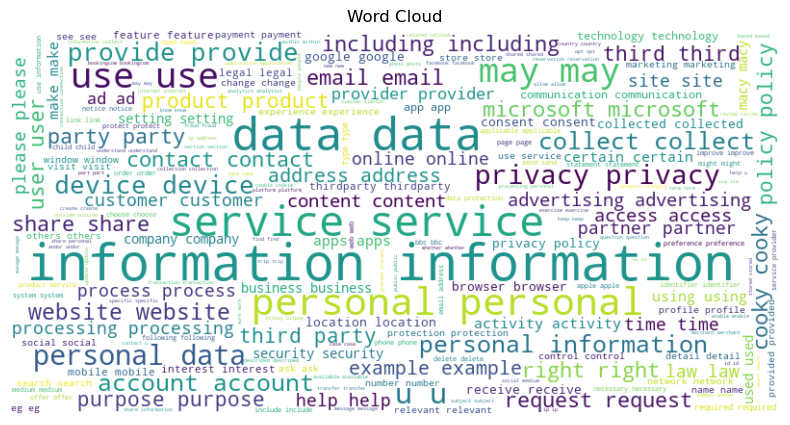

In [12]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Flatten the text_data_bigram list
all_bigrams = [token for tokens in text_data_bigram for token in tokens]

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_bigrams))

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud')
plt.show()

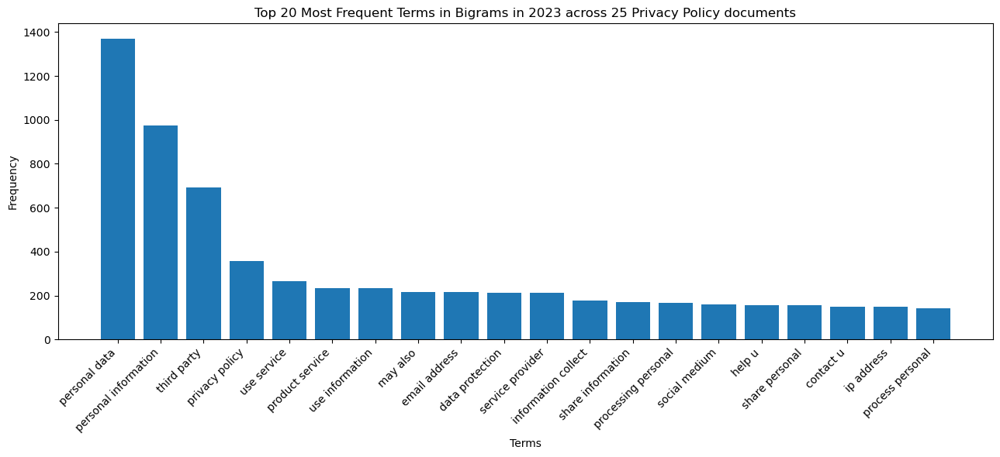

In [13]:
from collections import Counter
import matplotlib.pyplot as plt

# Calculate bigram frequencies
bigram_freq = Counter(all_bigrams)

# Sort the bigram frequencies in descending order and select the top N bigrams to plot
top_bigrams = bigram_freq.most_common(20)  # You can change the number to show more or fewer bigrams

# Extract the bigrams and frequencies from the top_bigrams list
bigrams = [bigram[0] for bigram in top_bigrams]
frequencies = [bigram[1] for bigram in top_bigrams]

# Create a bar chart
plt.figure(figsize=(13, 6))
plt.bar(bigrams, frequencies)
plt.xlabel('Terms')
plt.ylabel('Frequency')
plt.title('Top 20 Most Frequent Terms in Bigrams in 2023 across 25 Privacy Policy documents')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for better visibility

# Set the Y-axis ticks to have intervals of 100 up to 1500
plt.yticks(range(0, 1500, 200))

plt.tight_layout()
plt.show()

In [ ]:
colleted to collect 

## Term frequency 
### The top 12 terms along with the corresponding document number. It provides an overview of the most frequent terms in each document.

In [14]:
# Iterate over the documents in the corpus and corresponding dataset names
for i, (doc, dataset_name) in enumerate(zip(corpus, txt_data.keys())):
    # Sort the word frequencies in descending order
    sorted_doc = sorted(doc, key=lambda x: x[1], reverse=True)
    # Get the top 10 most frequent terms
    top_terms = sorted_doc[:10]
    
    # Print the dataset name and frequency header
    print(f"Dataset Name: {dataset_name}")
    print(f"{'Term': <20}{'Frequency'}")
    
    # Print the top terms and their frequencies
    for term_id, frequency in top_terms:
        term = dictionary[term_id]
        print(f"{term: <20}{frequency}")
    
    # Add a newline for better readability between datasets
    print("\n")

Dataset Name: apple_2023_cleaned_data.txt
Term                Frequency
personal data       121
privacy policy      27
apple id            20
may also            18
third party         18
apple may           14
data collected      14
data apple          11
privacy right       11
transfer personal   11


Dataset Name: arsenal_2023_cleaned_data.txt
Term                Frequency
personal data       74
process personal    16
website apps        15
social medium       14
emirate stadium     12
provide u           10
right withdraw      10
direct marketing    10
rely consent        9
football club       9


Dataset Name: bbc_2023_cleaned_data.txt
Term                Frequency
personal information130
bbc account         30
use information     29
bbc use             29
use personal        26
make sure           24
bbc service         24
parent guardian     23
share personal      21
outside uk          21


Dataset Name: bitpay_2023_cleaned_data.txt
Term                Frequency
personal data  

### The top 30 most frequent terms accross documents in bi-gram

In [15]:
# Create a list to store the overall word frequencies
overall_frequencies = {}

# Iterate over the documents in the corpus
for doc in corpus:
    # Update the overall word frequencies with the frequencies from the current document
    for term_id, frequency in doc:
        term = dictionary[term_id]
        if term in overall_frequencies:
            overall_frequencies[term] += frequency
        else:
            overall_frequencies[term] = frequency

# Sort the overall word frequencies in descending order
sorted_terms = sorted(overall_frequencies.items(), key=lambda x: x[1], reverse=True)

# Get the top 30 most frequent terms
top_terms = sorted_terms[:20]

# Print the top terms
for term, frequency in top_terms:
    print(f"{term}: {frequency}")


personal data: 1370
personal information: 976
third party: 691
privacy policy: 359
use service: 266
product service: 234
use information: 234
may also: 217
email address: 216
data protection: 213
service provider: 212
information collect: 178
share information: 170
processing personal: 168
social medium: 162
help u: 156
share personal: 155
contact u: 150
ip address: 149
process personal: 144


# Trigram 

In [33]:
# Bi-gram generation
text_data_bigrams = [list(nltk.ngrams(doc, 3)) for doc in tokenized_data]

# Print the number of documents and check if ":" exists in the tokenized data
print(len(text_data_bigrams))

25


In [34]:
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
text_data_bigrams_lemmatized = [[lemmatizer.lemmatize(' '.join(token)) for token in doc] for doc in text_data_bigrams]
print (text_data_bigrams_lemmatized[24])

['twitter privacy policy', 'privacy policy effective', 'policy effective may', 'effective may scroll', 'may scroll read', 'scroll read itâ\x80\x99s', 'read itâ\x80\x99s really', 'itâ\x80\x99s really hard', 'really hard make', 'hard make everyone', 'make everyone happy', 'everyone happy privacy', 'happy privacy policy', 'privacy policy people', 'policy people use', 'people use twitter', 'use twitter want', 'twitter want something', 'want something short', 'something short easy', 'short easy understand', 'easy understand wish', 'understand wish could', 'wish could fit', 'could fit everything', 'fit everything need', 'everything need know', 'need know tweet', 'know tweet regulator', 'tweet regulator ask', 'regulator ask u', 'ask u meet', 'u meet legal', 'meet legal obligation', 'legal obligation describing', 'obligation describing lot', 'describing lot detail', 'lot detail mind', 'detail mind weâ\x80\x99ve', 'mind weâ\x80\x99ve written', 'weâ\x80\x99ve written privacy', 'written privacy p

In [35]:
from gensim.corpora.dictionary import Dictionary

# Convert tuples to strings in text_data_ngram
text_data_bigram = [[str(token) for token in doc] for doc in text_data_bigrams_lemmatized]
# This list comprehension iterates over each bi-gram in text_data_bigrams and converts each token within the bi-gram to a string using the str() function. The result is a list of lists, where each inner list represents a converted bi-gram.

# Create the dictionary
dictionary = Dictionary(text_data_bigram)

print (dictionary)

Dictionary<76821 unique tokens: ['18002752273for information exercising', 'abides theapec crossborder', 'ability know access', 'able provide product', 'access apple data']...>


# Topic Modeling
The purpose of this code is to print the top words associated with each topic identified by the LDA model. By iterating over the topics and printing their information, you can gain insights into the words that define each topic and better understand the underlying themes in the text corpus.

In [58]:
from gensim.models import LdaModel

# Set the number of topics
num_topics = 20

# Train the LDA model
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary)

# Print the topics
for topic_id in range(num_topics):
    print(f"Topic {topic_id + 1}: {lda_model.print_topic(topic_id)}")

Topic 1: 0.001*"processing personal data" + 0.000*"process personal data" + 0.000*"european economic area" + 0.000*"data protection officer" + 0.000*"cooky similar technology" + 0.000*"information third party" + 0.000*"share personal information" + 0.000*"use personal data" + 0.000*"please contact u" + 0.000*"transfer personal data"
Topic 2: 0.000*"processing personal data" + 0.000*"cooky similar technology" + 0.000*"process personal data" + 0.000*"share personal information" + 0.000*"information third party" + 0.000*"open new window" + 0.000*"data protection officer" + 0.000*"use personal information" + 0.000*"name email address" + 0.000*"share personal data"
Topic 3: 0.000*"share personal information" + 0.000*"information third party" + 0.000*"personal data collected" + 0.000*"processing personal data" + 0.000*"share personal data" + 0.000*"transfer personal data" + 0.000*"use personal data" + 0.000*"process personal data" + 0.000*"european economic area" + 0.000*"cooky similar techn

# LDA Visualisation

In [59]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis


# Convert the LDA model to the pyLDAvis format
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)

# Visualize the topics
pyLDAvis.display(vis_data)

# Interpretation 

### Slide to adjust relevance metric: 
This slider allows you to adjust the relevance metric used in the visualization. Moving the slider changes the trade-off between term frequency (λ) and term-specific relevance (1 - λ).

### PC1 and PC2: 
These represent the principal components of the topic-term matrix. They help visualize the relationships between topics and terms.

### Marginal topic distribution:
This bar chart shows the distribution of topics across the entire corpus. Each bar represents a topic, and the height of the bar indicates the prevalence of that topic in the corpus.

### Intertopic Distance Map (via multidimensional scaling): 
This plot visualizes the similarity between topics. Topics that are closer to each other are more similar in terms of their term distribution.

### Overall term frequency: 
This bar chart displays the overall term frequency in the corpus. It gives an idea of how frequently each term appears across all topics.

### Estimated term frequency within the selected topic: 
This bar chart shows the estimated term frequency within the selected topic. It gives an idea of how important each term is within the chosen topic.

### Top-30 Most Relevant Terms: 
This table displays the top 30 most relevant terms in the selected topic. These terms are ranked based on their relevance score, which combines term frequency and term-specific relevance.

In [190]:
#pip install pyLDAvis matplotlib

In [60]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Convert the LDA model to the pyLDAvis format
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)

# Save the interactive visualization as an HTML file
pyLDAvis.save_html(vis_data, 'trigramLDAvisualization2023.html')


In [19]:
pip install selenium

Note: you may need to restart the kernel to use updated packages.


In [61]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Specify the path to the Chrome WebDriver
chrome_driver_path = "/Users/dipa/Desktop/AdvComSoc/GroupAssignment/chromedriver_mac64/chromedriver"

# Create a headless Chrome browser
chrome_options = Options()
chrome_options.add_argument('--headless')
driver = webdriver.Chrome(executable_path=chrome_driver_path, options=chrome_options)

# Convert the LDA model to the pyLDAvis format
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)

# Open the HTML file in the browser
html_file = 'trigramLDAvisualization2023.html'
pyLDAvis.save_html(vis_data, html_file)
driver.get(f'file://{html_file}')

# Take a screenshot and save it as an image
driver.save_screenshot('trigramLDAvisualization2023.png')

# Close the browser
driver.quit()

/var/folders/l3/cpjskr45605gtvdyzx71vqlm0000gp/T/ipykernel_44565/4098057231.py:12: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(executable_path=chrome_driver_path, options=chrome_options)


#  data 2014

In [18]:
import os
import chardet

# Define the directory path
directory = "/Users/dipa/Desktop/data25/previous_txt_data/"

# A list comprehension to create a list of file names that end with the ".txt" extension in the specified directory.
txt_files_2014 = [file for file in os.listdir(directory) if file.endswith(".txt")]

# Sort the file names in the desired order
sorted_txt_files_2014 = sorted(txt_files_2014)

# This line initializes an empty dictionary to store the contents of the text files, with the file names as keys.
txt_data_2014 = {}

# Function to detect the encoding of a file
def detect_encoding(file_path):
    with open(file_path, 'rb') as f:
        result = chardet.detect(f.read())
    return result['encoding']

# Loop over each file name in the sorted_txt_files_2014 list.
for file in sorted_txt_files_2014:
    # To concatenate the directory path and the current file name, creating the complete path to the file.
    file_path = os.path.join(directory, file)
    
    # Detect the encoding of the file
    file_encoding = detect_encoding(file_path)
    
    # Open the file specified by file_path in read mode using the detected encoding
    with open(file_path, "r", encoding=file_encoding) as txt_file_2014: 
        # Read the entire contents of the opened file and assign the content to the variable txt_text.
        txt_text = txt_file_2014.read()
        
        # Add the content of the current file (txt_text) to the txt_data_2014 dictionary, with the file name as the key.
        txt_data_2014[file] = txt_text

# Print the contents of each file
for file, text in txt_data_2014.items():
    print(f"Text from {file}:")
    print(text)
    print("\n")


Text from apple_2014.txt:



Privacy Policy Your privacy is important to Apple. So we've developed a Privacy Policy that covers how we collect, use, disclose, transfer, and store your information. Please take a moment to familiarize yourself with our privacy practices and let us know if you have any questions.


Collection and Use of Personal Information
Personal information is data that can be used to uniquely identify or contact a single person.  You may be asked to provide your personal information anytime you are in contact with Apple or an Apple affiliated company. Apple and its affiliates may share this personal information with each other and use it consistent with this Privacy Policy. They may also combine it with other information to provide and improve our products, services, content, and advertising.  Here are some examples of the types of personal information Apple may collect and how we may use it.


What personal information we collect
When you create an Apple ID, registe

In [19]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer

# Download necessary resources
nltk.download('punkt')
nltk.download('stopwords')

# Tokenization
tokenized_data_2014 = [word_tokenize(text.lower()) for text in txt_data_2014.values()]

# Removal of punctuation
punctuation = set(string.punctuation)
tokenized_data_2014 = [[token for token in tokens if token not in punctuation] for tokens in tokenized_data_2014]

# Removal of stopwords
stop_words = set(stopwords.words('english'))
tokenized_data_2014 = [[token for token in tokens if token.lower() not in stop_words] for tokens in tokenized_data_2014]

# Removal of numerical terms
tokenized_data_2014 = [[token for token in tokens if not token.isdigit()] for tokens in tokenized_data_2014]

# Removal of words with one or fewer characters
tokenized_data_2014 = [[token for token in tokens if len(token) > 1] for tokens in tokenized_data_2014]

# Lemmatization
lemmatizer = WordNetLemmatizer()
tokenized_data_2014 = [[lemmatizer.lemmatize(token) for token in tokens] for tokens in tokenized_data_2014]

# Print the number of documents and check if ":" exists in the tokenized data
print(len(tokenized_data_2014))
print(":" in tokenized_data_2014)
print("." in tokenized_data_2014)
print("," in tokenized_data_2014)

[nltk_data] Downloading package punkt to /Users/dipa/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/dipa/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


25
False
False
False


In [20]:
print (tokenized_data_2014)

[['privacy', 'policy', 'privacy', 'important', 'apple', "'ve", 'developed', 'privacy', 'policy', 'cover', 'collect', 'use', 'disclose', 'transfer', 'store', 'information', 'please', 'take', 'moment', 'familiarize', 'privacy', 'practice', 'let', 'u', 'know', 'question', 'collection', 'use', 'personal', 'information', 'personal', 'information', 'data', 'used', 'uniquely', 'identify', 'contact', 'single', 'person', 'may', 'asked', 'provide', 'personal', 'information', 'anytime', 'contact', 'apple', 'apple', 'affiliated', 'company', 'apple', 'affiliate', 'may', 'share', 'personal', 'information', 'use', 'consistent', 'privacy', 'policy', 'may', 'also', 'combine', 'information', 'provide', 'improve', 'product', 'service', 'content', 'advertising', 'example', 'type', 'personal', 'information', 'apple', 'may', 'collect', 'may', 'use', 'personal', 'information', 'collect', 'create', 'apple', 'id', 'register', 'product', 'apply', 'commercial', 'credit', 'purchase', 'product', 'download', 'softw

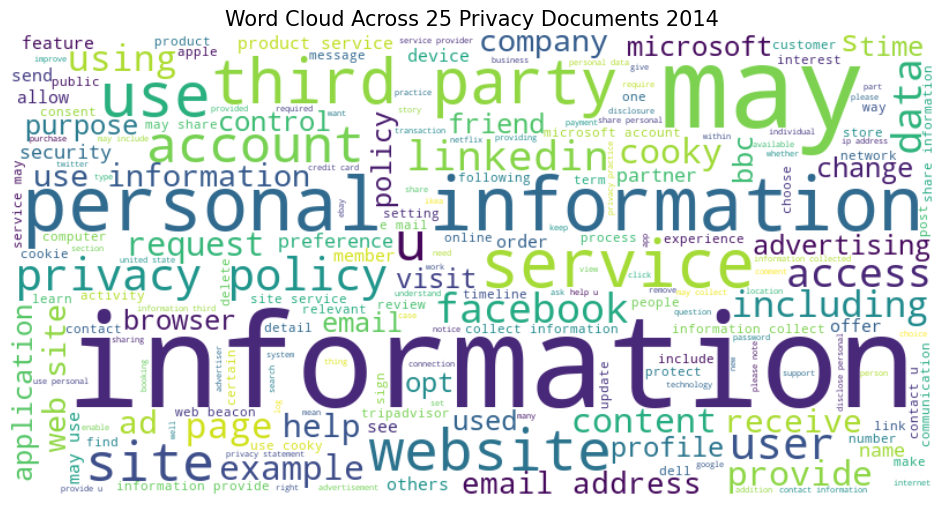

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Flatten the tokenized_data list
all_tokens = [token for sublist in tokenized_data_2014 for token in sublist]

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_tokens))

# Display the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud Across 25 Privacy Documents 2014', fontsize=15)
#plt.text(1.5, 0.5,"Word Cloud Across 25 Privacy Documents 2014", fontsize=20, ha='center')
plt.show()



In [22]:
from gensim.corpora import Dictionary

# Create a dictionary from tokenized_data_2014
dictionary = Dictionary(tokenized_data_2014)
print(dictionary)

Dictionary<3402 unique tokens: ["'re", "'s", "'ve", '//appleid.apple.com/', '//oo.apple.com']...>


In [23]:
from gensim.corpora import Dictionary


# Create a bag-of-words corpus
corpus_2014 = [dictionary.doc2bow(tokens) for tokens in tokenized_data_2014]
print (corpus_2014)


[[(0, 1), (1, 6), (2, 1), (3, 1), (4, 1), (5, 1), (6, 5), (7, 1), (8, 1), (9, 3), (10, 2), (11, 1), (12, 1), (13, 1), (14, 1), (15, 6), (16, 1), (17, 7), (18, 2), (19, 1), (20, 2), (21, 11), (22, 1), (23, 1), (24, 1), (25, 2), (26, 1), (27, 1), (28, 11), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 2), (36, 1), (37, 58), (38, 6), (39, 1), (40, 1), (41, 1), (42, 1), (43, 3), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 2), (56, 1), (57, 2), (58, 1), (59, 2), (60, 3), (61, 3), (62, 4), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 2), (69, 1), (70, 1), (71, 3), (72, 1), (73, 2), (74, 1), (75, 1), (76, 4), (77, 1), (78, 1), (79, 1), (80, 2), (81, 1), (82, 1), (83, 2), (84, 14), (85, 8), (86, 3), (87, 2), (88, 4), (89, 2), (90, 2), (91, 1), (92, 1), (93, 5), (94, 4), (95, 1), (96, 2), (97, 3), (98, 1), (99, 2), (100, 1), (101, 1), (102, 2), (103, 2), (104, 1), (105, 8), (106, 1), (107, 6), (108, 1), (109, 1), (110

# With N-gram (bi-gram) 2014 data 
In NLP, a bi-gram refers to a sequence of two adjacent words in a text. The nltk.ngrams function from the NLTK library is used to generate these bi-grams.

In [24]:
# Bi-gram generation
text_data_bigrams_2014 = [list(nltk.ngrams(doc, 2)) for doc in tokenized_data_2014]

# Print the number of documents and check if ":" exists in the tokenized data
print(len(text_data_bigrams_2014))

25


In [25]:
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
text_data_bigrams_2014_lemmatized = [[lemmatizer.lemmatize(' '.join(token)) for token in doc] for doc in text_data_bigrams_2014]
print (text_data_bigrams_2014_lemmatized[0])

['privacy policy', 'policy privacy', 'privacy important', 'important apple', "apple 've", "'ve developed", 'developed privacy', 'privacy policy', 'policy cover', 'cover collect', 'collect use', 'use disclose', 'disclose transfer', 'transfer store', 'store information', 'information please', 'please take', 'take moment', 'moment familiarize', 'familiarize privacy', 'privacy practice', 'practice let', 'let u', 'u know', 'know question', 'question collection', 'collection use', 'use personal', 'personal information', 'information personal', 'personal information', 'information data', 'data used', 'used uniquely', 'uniquely identify', 'identify contact', 'contact single', 'single person', 'person may', 'may asked', 'asked provide', 'provide personal', 'personal information', 'information anytime', 'anytime contact', 'contact apple', 'apple apple', 'apple affiliated', 'affiliated company', 'company apple', 'apple affiliate', 'affiliate may', 'may share', 'share personal', 'personal informat

# Create dictionary and Bag of words (2014 Bi-gram)

The dictionary is typically used in various text mining or natural language processing tasks, such as topic modeling, where it serves as a mapping between words (or in this case, bi-grams) and their unique integer IDs.

In [26]:
# Convert tuples to strings in text_data_ngram
text_data_bigram_2014 = [[str(token) for token in doc] for doc in text_data_bigrams_2014_lemmatized]
# This list comprehension iterates over each bi-gram in text_data_bigrams and converts each token within the bi-gram to a string using the str() function. The result is a list of lists, where each inner list represents a converted bi-gram.

# Create the dictionary
dictionary = Dictionary(text_data_bigram_2014)

print (dictionary)

Dictionary<23751 unique tokens: ["'re using", "'s latest", "'s privacy", "'s product", "'s respective"]...>


# Bag of Words (2014 Bi-gram)
The dictionary.doc2bow(tokens) is a method from the dictionary object that converts a list of tokens into a bag-of-words representation. doc2bow stands for "document to bag of words". It takes a list of tokens and returns a list of tuples, where each tuple represents a token's ID and its frequency (count) in the document.

The resulting list is assigned to the variable 'corpus', which represents the document-term matrix. It is a matrix-like structure where each row corresponds to a document, and each column represents a token's ID, with the cell value indicating the frequency of that token in the document.

In [27]:
# Create the corpus
corpus_2014 = [dictionary.doc2bow(doc) for doc in text_data_bigram_2014]
print(corpus_2014)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 2), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 2), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 3), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 2), (63, 1), (64, 1), (65, 1), (66, 4), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 4), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 2), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 2), (90, 4), (91, 3), (92, 1), (93, 1), (94, 6), (95, 1), (96, 3), (97, 1), (98, 4), (99, 4), (100, 2), (101, 1), (102, 1), (103, 1), (104, 1), (105, 1), (106, 3), (107, 1), (108, 1), (109, 1), (110, 1)

# Trigram

In [36]:
# Bi-gram generation
text_data_bigrams_2014 = [list(nltk.ngrams(doc, 3)) for doc in tokenized_data_2014]

# Print the number of documents and check if ":" exists in the tokenized data
print(len(text_data_bigrams_2014))

25


In [37]:
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
text_data_bigrams_2014_lemmatized = [[lemmatizer.lemmatize(' '.join(token)) for token in doc] for doc in text_data_bigrams_2014]
print (text_data_bigrams_2014_lemmatized[0])

['privacy policy privacy', 'policy privacy important', 'privacy important apple', "important apple 've", "apple 've developed", "'ve developed privacy", 'developed privacy policy', 'privacy policy cover', 'policy cover collect', 'cover collect use', 'collect use disclose', 'use disclose transfer', 'disclose transfer store', 'transfer store information', 'store information please', 'information please take', 'please take moment', 'take moment familiarize', 'moment familiarize privacy', 'familiarize privacy practice', 'privacy practice let', 'practice let u', 'let u know', 'u know question', 'know question collection', 'question collection use', 'collection use personal', 'use personal information', 'personal information personal', 'information personal information', 'personal information data', 'information data used', 'data used uniquely', 'used uniquely identify', 'uniquely identify contact', 'identify contact single', 'contact single person', 'single person may', 'person may asked', 

In [38]:
# Convert tuples to strings in text_data_ngram
text_data_bigram_2014 = [[str(token) for token in doc] for doc in text_data_bigrams_2014_lemmatized]
# This list comprehension iterates over each bi-gram in text_data_bigrams and converts each token within the bi-gram to a string using the str() function. The result is a list of lists, where each inner list represents a converted bi-gram.

# Create the dictionary
dictionary = Dictionary(text_data_bigram_2014)

print (dictionary)

Dictionary<34251 unique tokens: ["'re using safari", "'s latest product", "'s privacy policy", "'s product service", "'s respective privacy"]...>


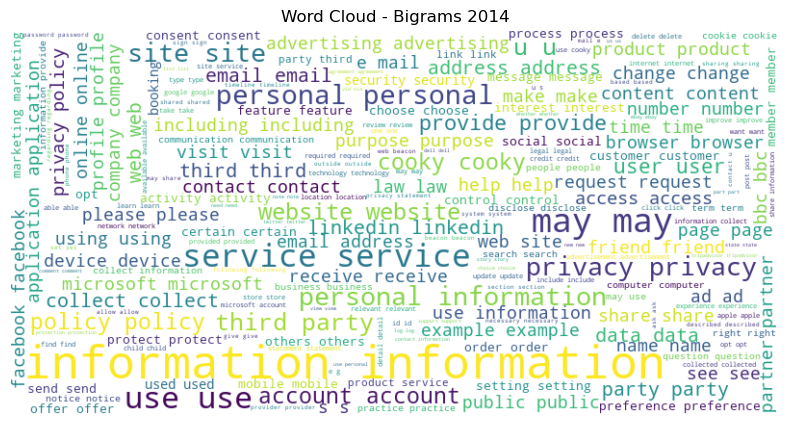

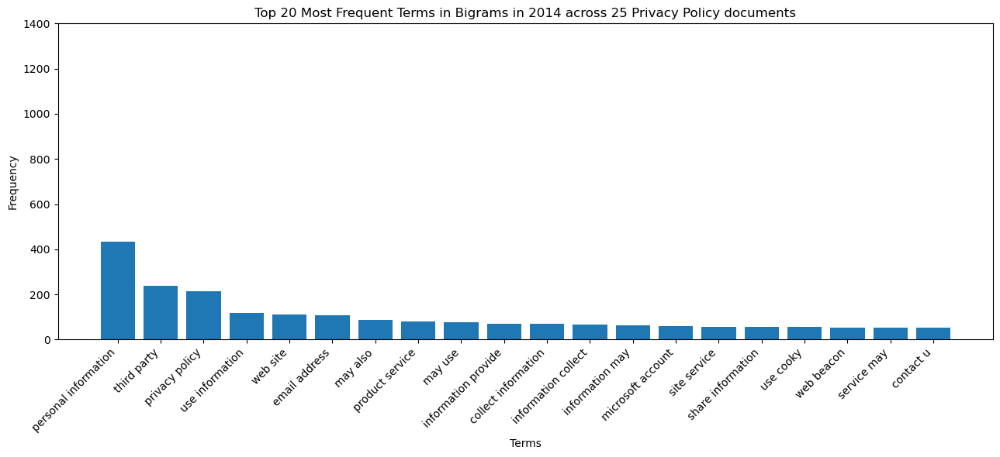

In [28]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Flatten the text_data_bigram_2014 list
all_bigrams_2014 = [token for tokens in text_data_bigram_2014 for token in tokens]

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_bigrams_2014))

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud - Bigrams 2014')
plt.show()

# Calculate bigram frequencies
bigram_freq_2014 = Counter(all_bigrams_2014)

# Sort the bigram frequencies in descending order and select the top N bigrams to plot
top_bigrams_2014 = bigram_freq_2014.most_common(20)  # You can change the number to show more or fewer bigrams

# Extract the bigrams and frequencies from the top_bigrams_2014 list
bigrams_2014 = [bigram[0] for bigram in top_bigrams_2014]
frequencies_2014 = [bigram[1] for bigram in top_bigrams_2014]

# Create a bar chart
plt.figure(figsize=(13, 6))
plt.bar(bigrams_2014, frequencies_2014)
plt.xlabel('Terms')
plt.ylabel('Frequency')
plt.title('Top 20 Most Frequent Terms in Bigrams in 2014 across 25 Privacy Policy documents')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for better visibility

# Set the Y-axis ticks to have intervals of 100 up to 1500
plt.yticks(range(0, 1500, 200))
plt.tight_layout()
plt.show()


## Term frequency (2014 Bi-gram)
### The top 12 terms along with the corresponding document number. It provides an overview of the most frequent terms in each document.

In [29]:
# Iterate over the documents in the corpus_2014
for i, doc in enumerate(corpus_2014):
    # Sort the word frequencies in descending order
    sorted_doc = sorted(doc, key=lambda x: x[1], reverse=True)
    # Get the top 10 most frequent terms
    top_terms = sorted_doc[:10]
    # Print the document number and its top terms
    print(f"Document {i+1}:")
    for term_id, frequency in top_terms:
        term = dictionary[term_id]
        print(f"{term}: {frequency}")
    print("\n")

Document 1:
personal information: 41
product service: 14
privacy policy: 11
non-personal information: 9
help u: 8
may collect: 7
may use: 7
apple may: 6
third party: 6
use personal: 6


Document 2:
privacy policy: 8
abl arsenal: 8
associated company: 8
data protection: 8
personal information: 7
protection officer: 7
use information: 6
company partner: 6
information provide: 5
another route: 5


Document 3:
personal information: 34
bbc website: 23
privacy policy: 17
bbc worldwide: 17
use personal: 12
third party: 11
information bbc: 10
outside uk: 10
activity online: 9
online content: 9


Document 4:
bitpay service: 14
third party: 13
personal information: 12
may also: 5
use bitpay: 5
collect information: 4
using bitpay: 4
information computer: 3
privacy policy: 3
service content: 3


Document 5:
personal information: 19
third party: 8
email address: 3
information collected: 3
privacy policy: 3
information third: 3
information submitted: 3
black friday: 3
friday notification: 3
persiste

In [167]:
from tabulate import tabulate

# Create an empty list to store the results
results = []

# Iterate over the documents in the corpus_2014
for i, doc in enumerate(corpus_2014):
    # Sort the word frequencies in descending order
    sorted_doc = sorted(doc, key=lambda x: x[1], reverse=True)
    # Get the top 10 most frequent terms
    top_terms = sorted_doc[:10]
    
    # Create a list of lists to store the results for this document
    document_results = []
    for term_id, frequency in top_terms:
        term = dictionary[term_id]
        document_results.append([term, frequency])
    
    # Add the document number as a header row
    document_results.insert(0, [f"Document {i+1}", "Frequency"])
    
    # Add the results to the overall list
    results.extend(document_results)

# Print the results in a table format
print(tabulate(results, headers="firstrow"))


Document 1                Frequency
------------------------  -----------
personal information      41
product service           14
privacy policy            11
non-personal information  9
help u                    8
may collect               7
may use                   7
apple may                 6
third party               6
use personal              6
Document 2                Frequency
privacy policy            8
abl arsenal               8
associated company        8
data protection           8
personal information      7
protection officer        7
use information           6
company partner           6
information provide       5
another route             5
Document 3                Frequency
personal information      34
bbc website               23
privacy policy            17
bbc worldwide             17
use personal              12
third party               11
information bbc           10
outside uk                10
activity online           9
online content            9
Doc

In [31]:
# Combine all documents from both corpus_2014 and corpus_2023 into a single list
all_documents = corpus_2014

# Create a dictionary to store the word frequencies
word_freq = {}

# Iterate over all the documents and count the word occurrences
for doc in all_documents:
    for word_id, freq in doc:
        word = dictionary[word_id]
        word_freq[word] = word_freq.get(word, 0) + freq

# Sort the word frequencies in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# Get the top 20 most frequent terms
top_terms = sorted_word_freq[:20]

# Print the top terms
print("Top 20 most frequent terms:")
for term, frequency in top_terms:
    print(f"{term}: {frequency}")


Top 20 most frequent terms:
personal information: 435
third party: 239
privacy policy: 214
use information: 117
web site: 110
email address: 108
may also: 88
product service: 79
may use: 76
information provide: 71
collect information: 69
information collect: 67
information may: 64
microsoft account: 59
site service: 58
share information: 58
use cooky: 57
contact u: 53
service may: 53
web beacon: 53


In [40]:
from gensim.models import LdaModel

# Set the number of topics
num_topics = 20

# Train the LDA model
lda_model = LdaModel(corpus_2014, num_topics=num_topics, id2word=dictionary)

# Print the topics
for topic_id in range(num_topics):
    print(f"Topic {topic_id + 1}: {lda_model.print_topic(topic_id)}")

Topic 1: 0.001*"information third party" + 0.000*"use personal information" + 0.000*"information provide u" + 0.000*"personal information provide" + 0.000*"may use information" + 0.000*"share personal information" + 0.000*"outside united state" + 0.000*"disclose personal information" + 0.000*"personally identifiable information" + 0.000*"address telephone number"
Topic 2: 0.001*"use personal information" + 0.001*"disclose personal information" + 0.000*"information third party" + 0.000*"personal information provide" + 0.000*"share personal information" + 0.000*"access personal information" + 0.000*"may collect information" + 0.000*"may use information" + 0.000*"information provide u" + 0.000*"may share information"
Topic 3: 0.001*"disclose personal information" + 0.000*"information third party" + 0.000*"use personal information" + 0.000*"share personal information" + 0.000*"may use information" + 0.000*"may collect information" + 0.000*"personal information provide" + 0.000*"personal in

In [41]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis


# Convert the LDA model to the pyLDAvis format
vis_data = gensimvis.prepare(lda_model, corpus_2014, dictionary)

# Visualize the topics
pyLDAvis.display(vis_data)

In [42]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Convert the LDA model to the pyLDAvis format
vis_data = gensimvis.prepare(lda_model, corpus_2014, dictionary)

# Save the interactive visualization as an HTML file
pyLDAvis.save_html(vis_data, 'trigramLDAvisualization2014.html')


In [43]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Specify the path to the Chrome WebDriver
chrome_driver_path = "/Users/dipa/Desktop/AdvComSoc/GroupAssignment/chromedriver_mac64/chromedriver"

# Create a headless Chrome browser
chrome_options = Options()
chrome_options.add_argument('--headless')
driver = webdriver.Chrome(executable_path=chrome_driver_path, options=chrome_options)

# Convert the LDA model to the pyLDAvis format
vis_data = gensimvis.prepare(lda_model, corpus_2014, dictionary)

# Open the HTML file in the browser
html_file = 'trigramLDAvisualization2014.html'
pyLDAvis.save_html(vis_data, html_file)
driver.get(f'file://{html_file}')

# Take a screenshot and save it as an image
driver.save_screenshot('trigramLDAvisualization2014.png')

# Close the browser
driver.quit()

/var/folders/l3/cpjskr45605gtvdyzx71vqlm0000gp/T/ipykernel_44565/511732604.py:12: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(executable_path=chrome_driver_path, options=chrome_options)


# Comparision 2014 and 2023 data

In [250]:
import os

# Define the directory paths
directory_2023 = "/Users/dipa/Desktop/data25/txt_data/"
directory_2014 = "/Users/dipa/Desktop/data25/data_2014/"

# Import the 2023 dataset
data_2023 = {}
for file in files_2023:
    file_path = os.path.join(directory_2023, file)
    with open(file_path, "r", encoding='utf-8', errors='replace') as txt_file:
        data_2023[file] = txt_file.read()

# Import the 2014 dataset
data_2014 = {}
for file in files_2014:
    file_path = os.path.join(directory_2014, file)
    with open(file_path, "r", encoding='latin-1', errors='replace') as txt_file:
        data_2014[file] = txt_file.read()

        
# Print the contents of the 2023 dataset
for filename, text in data_2023.items():
    print(f"Contents of {filename}:")
    print(text)
    print("\n")


Contents of apple_2023_cleaned_data.txt:
Apple Privacy Policy
Apple’s Privacy Policy describes how Apple collects, uses, and shares your personal data.
In addition to this Privacy Policy, we provide data and privacy information embedded in our products and certain features that ask to use your personal data. This product-specific information is accompanied by our Data & Privacy Icon.
You will be given an opportunity to review this product-specific information before using these features. You also can view this information at any time, either in settings related to those features and/or online atapple.com/legal/privacy/data.
You can familiarize yourself with our privacy practices, accessible via the headings below, andcontact usif you have any questions.
Download a copy of this Privacy PolicyYour California Privacy DisclosuresInformation Regarding Commercial Electronic Messages in CanadaApple Health Study Apps Privacy Policy
At Apple, we believe strongly in fundamental privacy rights — 

In [251]:
# Print the contents of the 2014 dataset
for filename, text in data_2014.items():
    print(f"Contents of {filename}:")
    print(text)
    print("\n")

Contents of apple_2014.txt:



Privacy Policy Your privacy is important to Apple. So we've developed a Privacy Policy that covers how we collect, use, disclose, transfer, and store your information. Please take a moment to familiarize yourself with our privacy practices and let us know if you have any questions.


Collection and Use of Personal Information
Personal information is data that can be used to uniquely identify or contact a single person.  You may be asked to provide your personal information anytime you are in contact with Apple or an Apple affiliated company. Apple and its affiliates may share this personal information with each other and use it consistent with this Privacy Policy. They may also combine it with other information to provide and improve our products, services, content, and advertising.  Here are some examples of the types of personal information Apple may collect and how we may use it.


What personal information we collect
When you create an Apple ID, regis

In [235]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer

# Download necessary resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Function to perform text preprocessing
def preprocess_text(text):
    # Tokenization
    tokens = word_tokenize(text)
    
    # Lowercase conversion
    tokens = [token.lower() for token in tokens]
    
    # Removal of stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]
    
    # Removal of punctuation
    tokens = [token for token in tokens if token not in string.punctuation]
    
    # Removal of numerical terms
    tokens = [token for token in tokens if not token.isdigit()]
    
    # Removal of words with two or fewer characters
    tokens = [token for token in tokens if len(token) > 2]
    
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    
    return tokens

# Preprocess the 2023 dataset
preprocessed_data_2023 = {}
for filename, text in data_2023.items():
    preprocessed_text = preprocess_text(text)
    preprocessed_data_2023[filename] = preprocessed_text

# Preprocess the 2014 dataset
preprocessed_data_2014 = {}
for filename, text in data_2014.items():
    preprocessed_text = preprocess_text(text)
    preprocessed_data_2014[filename] = preprocessed_text


[nltk_data] Downloading package punkt to /Users/dipa/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/dipa/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/dipa/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [236]:
# Print the preprocessed data for the 2023 dataset
print("Preprocessed Data for 2023 Dataset:")
for filename, tokens in preprocessed_data_2023.items():
    print(f"Filename: {filename}")
    print("Tokens:", tokens)
    print()


Preprocessed Data for 2023 Dataset:
Filename: apple_2023_cleaned_data.txt
Tokens: ['apple', 'privacy', 'policy', 'apple', 'privacy', 'policy', 'describes', 'apple', 'collect', 'us', 'share', 'personal', 'data', 'addition', 'privacy', 'policy', 'provide', 'data', 'privacy', 'information', 'embedded', 'product', 'certain', 'feature', 'ask', 'use', 'personal', 'data', 'product-specific', 'information', 'accompanied', 'data', 'privacy', 'icon', 'given', 'opportunity', 'review', 'product-specific', 'information', 'using', 'feature', 'also', 'view', 'information', 'time', 'either', 'setting', 'related', 'feature', 'and/or', 'online', 'atapple.com/legal/privacy/data', 'familiarize', 'privacy', 'practice', 'accessible', 'via', 'heading', 'andcontact', 'usif', 'question', 'download', 'copy', 'privacy', 'policyyour', 'california', 'privacy', 'disclosuresinformation', 'regarding', 'commercial', 'electronic', 'message', 'canadaapple', 'health', 'study', 'apps', 'privacy', 'policy', 'apple', 'belie

In [237]:

# Print the preprocessed data for the 2014 dataset
print("Preprocessed Data for 2014 Dataset:")
for filename, tokens in preprocessed_data_2014.items():
    print(f"Filename: {filename}")
    print("Tokens:", tokens)
    print()


Preprocessed Data for 2014 Dataset:
Filename: apple_2014.txt
Tokens: ['privacy', 'policy', 'privacy', 'important', 'apple', "'ve", 'developed', 'privacy', 'policy', 'cover', 'collect', 'use', 'disclose', 'transfer', 'store', 'information', 'please', 'take', 'moment', 'familiarize', 'privacy', 'practice', 'let', 'know', 'question', 'collection', 'use', 'personal', 'information', 'personal', 'information', 'data', 'used', 'uniquely', 'identify', 'contact', 'single', 'person', 'may', 'asked', 'provide', 'personal', 'information', 'anytime', 'contact', 'apple', 'apple', 'affiliated', 'company', 'apple', 'affiliate', 'may', 'share', 'personal', 'information', 'use', 'consistent', 'privacy', 'policy', 'may', 'also', 'combine', 'information', 'provide', 'improve', 'product', 'service', 'content', 'advertising', 'example', 'type', 'personal', 'information', 'apple', 'may', 'collect', 'may', 'use', 'personal', 'information', 'collect', 'create', 'apple', 'register', 'product', 'apply', 'commerc

### To calculate the cosine similarity between the preprocessed 2023 dataset and the preprocessed 2014 dataset, steps:

In [238]:
#Import the necessary libraries:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


In [239]:
# Preprocess the 2023 dataset:
preprocessed_data_2023 = {}
for filename, text in data_2023.items():
    preprocessed_text = preprocess_text(text)  # Use your custom preprocess_text function
    preprocessed_data_2023[filename] = preprocessed_text


In [240]:
#Preprocess the 2014 dataset:
preprocessed_data_2014 = {}
for filename, text in data_2014.items():
    preprocessed_text = preprocess_text(text)  # Use your custom preprocess_text function
    preprocessed_data_2014[filename] = preprocessed_text


In [241]:
corpus_2023 = [str(doc) for doc in preprocessed_data_2023.values()]
corpus_2014 = [str(doc) for doc in preprocessed_data_2014.values()]

vectorizer = TfidfVectorizer()
tfidf_matrix_2023 = vectorizer.fit_transform(corpus_2023)
tfidf_matrix_2014 = vectorizer.transform(corpus_2014)


In [242]:
#Calculate the cosine similarity between the datasets:
cosine_similarities = cosine_similarity(tfidf_matrix_2023, tfidf_matrix_2014)


In [243]:
#Print the cosine similarity matrix:
print(cosine_similarities)


[[0.85072142 0.18618377 0.08033357 0.15833514 0.20843334 0.21107635
  0.19858129 0.15437299 0.22162725 0.14676456 0.13033905 0.25911371
  0.16245179 0.14194526 0.13641747 0.2753485  0.16370064 0.14905491
  0.16791174 0.17254271 0.26769142 0.21076798 0.22460231 0.17063087
  0.23031426]
 [0.24644993 0.63593278 0.09313647 0.17206219 0.25455725 0.22916911
  0.23878703 0.17599064 0.24094971 0.18038462 0.18968634 0.26338795
  0.19097219 0.16422687 0.14958869 0.39360706 0.17214923 0.17128383
  0.17127375 0.18839458 0.27078608 0.22334286 0.25079226 0.19563849
  0.22762389]
 [0.26165606 0.22684859 0.81396312 0.203937   0.26185297 0.27343835
  0.23687306 0.17566905 0.25623317 0.23874817 0.06975192 0.36492242
  0.2108466  0.16880753 0.16535886 0.27448239 0.17661869 0.19207384
  0.19479905 0.21299263 0.28401779 0.25143009 0.24978633 0.20934632
  0.27609822]
 [0.27338405 0.22523389 0.09535042 0.66711994 0.29006489 0.25281333
  0.24914329 0.18582976 0.26451432 0.16494699 0.17420114 0.2947842
  0.197

In [244]:
document_names_2023 = list(preprocessed_data_2023.keys())
document_names_2014 = list(preprocessed_data_2014.keys())

print("2023 Dataset Documents:")
print(document_names_2023)
print("\n2014 Dataset Documents:")
print(document_names_2014)


2023 Dataset Documents:
['apple_2023_cleaned_data.txt', 'arsenal_2023_cleaned_data.txt', 'bbc_2023_cleaned_data.txt', 'bitpay_2023_cleaned_data.txt', 'blackfriday_2023_cleaned_data.txt', 'blockchain_2023_cleaned_data.txt', 'booking_2023_cleaned_data.txt', 'dell_2023_cleaned_data.txt', 'ebay_2023_cleaned_data.txt', 'facebook_2023_cleaned_data.txt', 'fcbarcelona_2023_cleaned_data.txt', 'google_2023_cleaned_data.txt', 'ikea_2023_cleaned_data.txt', 'irishtimes_2023_cleaned_data.txt', 'linkedIn_2023_cleaned_data.txt', 'liverpoolfc_2023_cleaned_data.txt', 'macys_2023_cleaned_data.txt', 'makeupalley_2023_cleaned_data.txt', 'microsoft_2023_cleaned_data.txt', 'netflix_2023_cleaned_data.txt', 'samsung_2023_cleaned_data.txt', 'shopzilla_2023_cleaned_data.txt', 'totalbeauty_2023_cleaned_data.txt', 'tripadvisor_2023_cleaned_data.txt', 'twitter_2023_cleaned_data.txt']

2014 Dataset Documents:
['apple_2014.txt', 'arsenal_2014.txt', 'bbc_2014.txt', 'bitpay_2014.txt', 'blackfriday_2014.txt', 'blockchai

### Interpretation 

0.85072142 is the result of cosine similarity scores between first document of 2023 and the   1st document of 2014.
0.18618377 is the result of cosine similarity scores between first document of 2023 and the   2nd document of 2014. 
0.08033357 is the result of cosine similarity scores between first document of 2023 and the   3rd document of 2014. 
0.15833514 is the result of cosine similarity scores between first document of 2023 and the   4th document of 2014. 
0.20843334 is the result of cosine similarity scores between first document of 2023 and the   5th document of 2014. 
0.21107635 is the result of cosine similarity scores between first document of 2023 and the   6th document of 2014. 
0.19858129 is the result of cosine similarity scores between first document of 2023 and the   7th document of 2014. 
0.15437299 is the result of cosine similarity scores between first document of 2023 and the   8th document of 2014. 
0.22162725 is the result of cosine similarity scores between first document of 2023 and the   9th document of 2014. 
0.14676456 is the result fo cosine similarity scores between first document of 2023 and the   10th document of 2014. 
0.13033905 is the result of cosine similarity scores between first document of 2023 and the   11th document of 2014. 
0.25911371 is the result of cosine similarity scores between first document of 2023 and the   12th document of 2014. 
0.16245179 is the result of cosine similarity scores between first document of 2023 and the   13th document of 2014. 
0.14194526 is the result of cosine similarity scores between first document of 2023 and the   14th document of 2014. 
0.13641747 is the result of cosine similarity scores between first document of 2023 and the   15th document of 2014. 
0.2753485  is the result of cosine similarity scores between first document of 2023 and the   16th document of 2014. 
0.16370064 is the result of cosine similarity scores between first document of 2023 and the   17th document of 2014. 
0.14905491 is the result of cosine similarity scores between first document of 2023 and the   18th document of 2014. 
0.16791174 is the result of cosine similarity scores between first document of 2023 and the   19th document of 2014. 
0.17254271 is the result of cosine similarity scores between first document of 2023 and the   20th document of 2014. 
0.26769142 is the result of cosine similarity scores between first document of 2023 and the   21st document of 2014. 
0.21076798 is the result of cosine similarity scores between first document of 2023 and the   22nd document of 2014. 
0.22460231 is the result of cosine similarity scores between first document of 2023 and the   23rd document of 2014. 
0.17063087 is the result of cosine similarity scores between first document of 2023 and the   24th document of 2014. 
0.23031426 is the result of cosine similarity scores between first document of 2023 and the   25th document of 2014. 